# Integrantes

* Tomas Acosta Bernal
* Diego Alejandro Castro
* David Felipe Pineda

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sb
import ydata_profiling
from sklearn.preprocessing import MultiLabelBinarizer


# Exploracion Datos

In [2]:
df = pd.read_csv('.\\data/datos_apartamentos_rent.csv',sep=';')


In [3]:
ydata_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]


# Revision de cada columna del diccionario de datos

### ID

id = identificador único del apartamento. Unicamente debe haber un id por fila. Ademas, el id no es necesario para el procesamiento de los datos ya que este valor no va a afectar a la tarea de regresion o clasificacion.

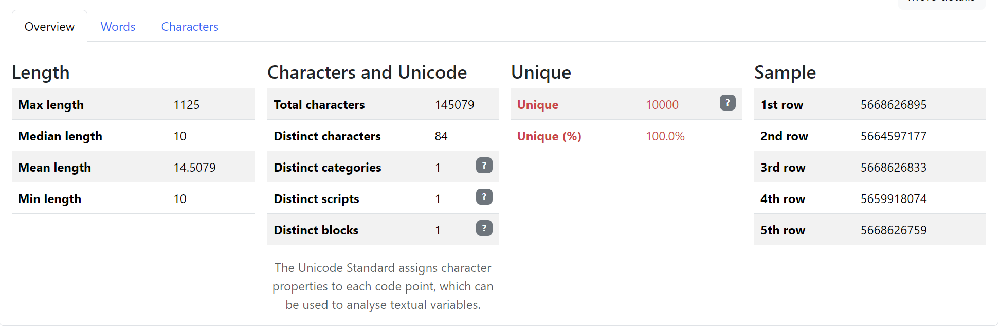

In [4]:
df.drop(columns=['id'],inplace=True)

### Category

podrian tomarse los valores que no pertenezcan a la categoria grande a una nueva categorita ya que son casi despreciables

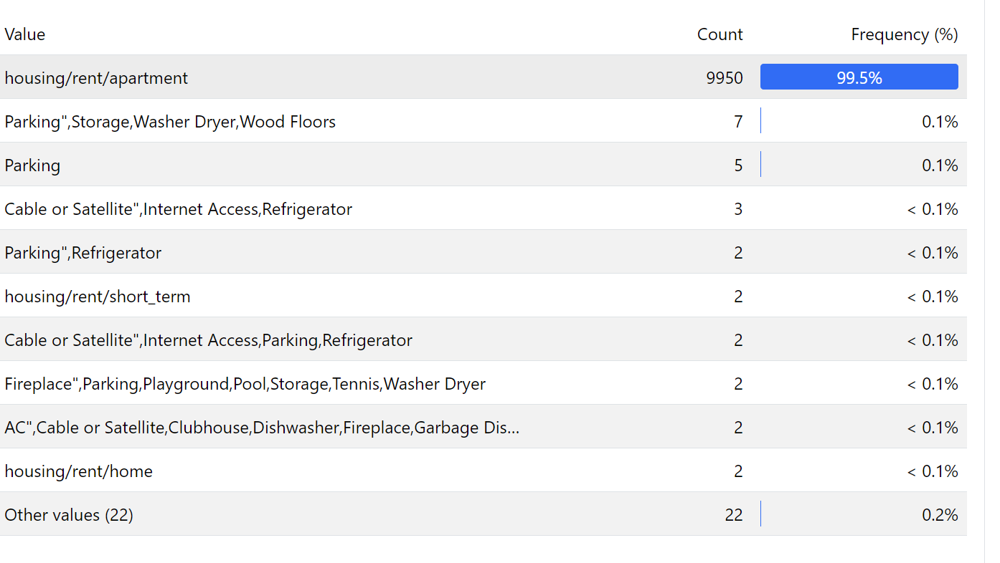

In [5]:
def category_transformation(item):
    try:
        if item != "housing/rent/apartment":
            item = "other"
        return item
    except Exception as e:
        print(f"Error on category_transformation as :{e}")

df['category'] = df['category'].apply(lambda x: category_transformation(x))

In [6]:
df.drop(columns="category",inplace=True)

### Title

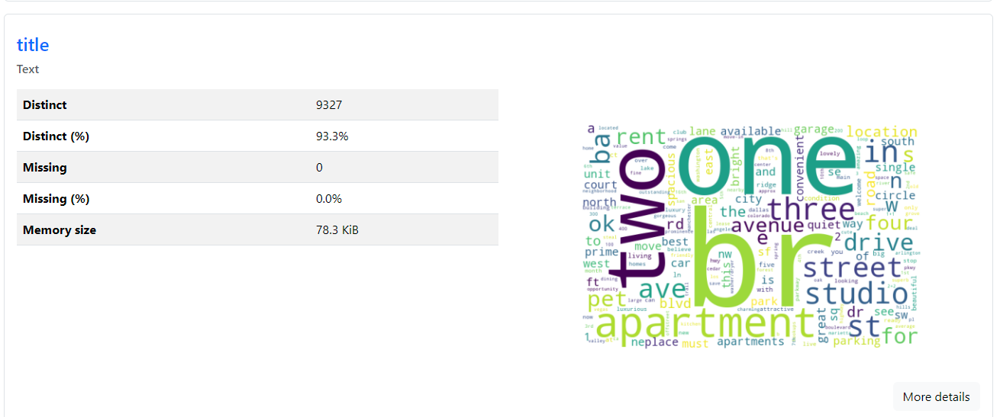

In [7]:
df['title'].describe()

count                           10000
unique                           9327
top       Apartment in great location
freq                               38
Name: title, dtype: object

Eliminar los valores que son unicamente numeros y no son nada de str.

In [8]:
def delete_non_string_values(dataFrame, column='title'):
    drop_index = []
    for i, value in enumerate(dataFrame[column]):
        try:
            if isinstance(value, (int, float)) or float(value):
                print(value, i)
                drop_index.append(i)
        except ValueError:
            continue
        
    dataFrame.drop(drop_index, inplace= True)
    dataFrame.reset_index(inplace=True)
    dataFrame.drop(columns = ['index'], inplace=True)
    return dataFrame

In [9]:
df = delete_non_string_values(df)

1 206
1 208
1 209
1 211
1 213
1 1217
1 2101
1 2275
1 2381
1 3944
1 4010
1 4365
1 4468
1 4479
1 4553
1 4640
1 4803
1 4999
1 5147
2 5642
1 5841
1 6013
1 6203
1 6204
2 6278
2 6317
2 6323
2 6324
2 6327
2 6329
2 6332
2 6534
1 6703
2 6988
2 7251
2 7495
2 7610
2 7649
2 7688
2 8017
2 8327
2 8362
2 8618
2 8883
2 9557
3.5 9872


eliminar elementos float

In [10]:
for i in range(len(df['title'])):
    if len(df['title'][i]) < 15:
        print(df['title'][i])

One BR Line St
One BR Oak Dr
One BR 1st Ave
One BR Totem
One BR Park St
One BR Cr 25
5115 N 40th St
Dallas Value!
One BR 310 Oak
Gifford Value!
One BR 0
The Rise
715 Madison St
319 S B St 4
Verve
703 Monona Ave
Duplex
Bella Vista
809 Ave G 2
One BR 1 BR
17 W 3rd St 1
Hanover Value!
Hanover Value!
Cary Value!
Rya Suites.
908 8th SW St
400 Dover Cir
9801 E 61st St
6045 N Main St
Two BR 2 BR
Kent Value!
908 8th SW St
The Oasis - B1
Denver Value!
617 Union Ave
Toledo Value!
100 Plum Ave
Two BR Unit A
146 George St
159 West St.
Duplex
Dayton Value!
704 Main St
Mebane Value!
One BR Park Pl
908 8th SW St
Two BR Lincoln
440 Court St 2
Two BR Slape
Cumming Value!
Great Loft


In [11]:
df.drop(columns="title",inplace=True)

# body

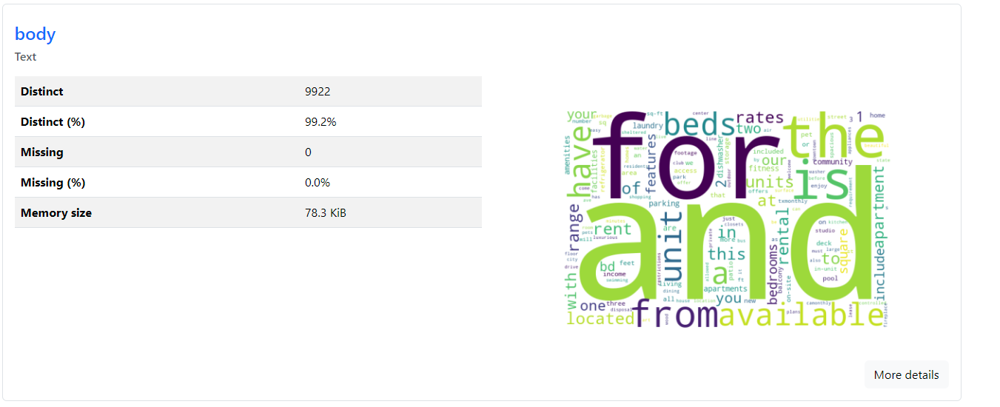

revisar si todos los datos tienen "this unit is located at" o no

In [12]:
cont = 0
not_cont = 0
for i in range(len(df['body'])):
    if 'this unit is located at' in df['body'][i].lower():
        cont += 1
    else:
        not_cont += 1
print(not_cont)

3168


no todos lo tienen entonces omitimos esta y luego revisamos si es significativa o no para tomar en cuenta

In [13]:
df.drop(columns="body",inplace=True)

# Amenities

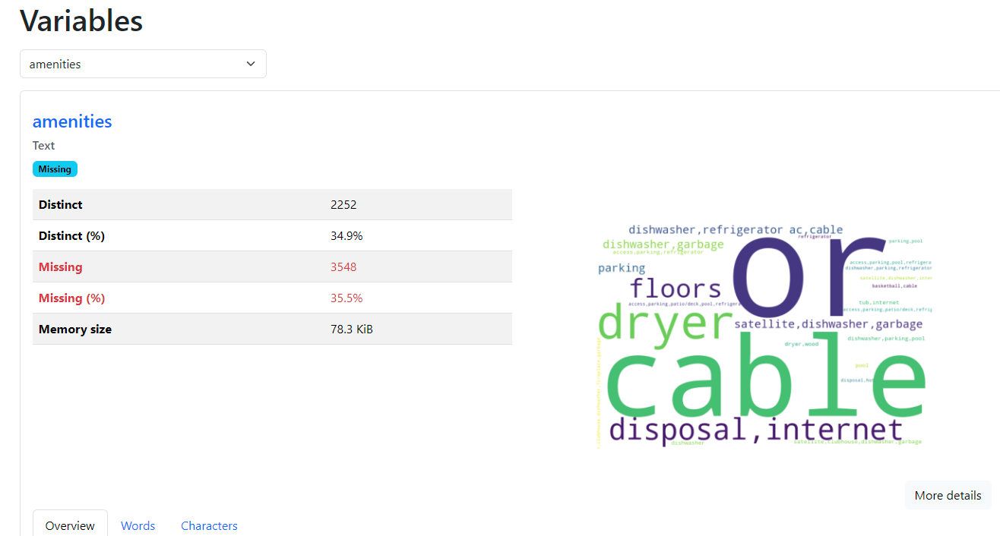

Ahora procedemos a volver una variable binaria cada una de las amenidade para ver cual aporta mas como features importantes del modelo

In [14]:
for i in range(0,len(df['amenities'])):
    print(df['amenities'][i])

nan
nan
nan
nan
nan
Dishwasher,Elevator,Patio/Deck,Pool,Storage
nan
nan
Refrigerator
nan
nan
nan
nan
nan
Refrigerator
AC,Basketball,Cable or Satellite,Gym,Internet Access,Patio/Deck,Pool,Refrigerator
AC,Basketball,Cable or Satellite,Gym,Internet Access,Patio/Deck,Pool,Refrigerator
nan
nan
Pool
nan
Cable or Satellite,Clubhouse,Elevator,Internet Access,Parking,Pool,Refrigerator
nan
Pool
nan
nan
nan
nan
Pool
Pool
Pool
Pool
nan
nan
nan
nan
nan
nan
nan
nan
Cable or Satellite,Dishwasher,Internet Access,Parking,Refrigerator
nan
nan
nan
nan
nan
Dishwasher,Refrigerator
nan
nan
nan
Dishwasher
nan
Pool
nan
nan
nan
Pool
nan
Pool
nan
nan
nan
nan
nan
nan
Pool
Pool
nan
nan
nan
nan
nan
Pool
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
Pool
nan
nan
nan
nan
nan
nan
nan
Pool
nan
Pool
Pool
nan
nan
Pool
nan
nan
nan
nan
nan
Pool
Pool
nan
Pool
Cable or Satellite,Internet Access,Parking,Refrigerator
Pool
nan
nan
nan
nan
Pool
nan
Pool
nan
nan
nan
nan
nan
nan
nan
nan
Pool
nan
nan
nan
nan
Pool
nan
nan
nan
nan

Reemplazar NaN con cadenas vacías y limpiar espacios en cada amenidad, Convertir en listas de amenidades, Aplicar MultiLabelBinarizer para transformar en variables binarias



In [15]:
df['amenities'] = df['amenities'].fillna('').apply(lambda x: ','.join(sorted(set([i.strip().replace('"', '') for i in x.split(',')]))))

df['amenities'] = df['amenities'].apply(lambda x: x.split(',') if x else [])

mlb = MultiLabelBinarizer()
amenities_encoded = pd.DataFrame(mlb.fit_transform(df['amenities']), columns=mlb.classes_)

df = df.drop(columns=['amenities']).join(amenities_encoded)


In [16]:
ydata_profiling.ProfileReport(df[['AC', 'Alarm', 'Basketball', 'Cable or Satellite', 'Clubhouse',
       'Dishwasher', 'Doorman', 'Elevator', 'Fireplace', 'Garbage Disposal',
       'Gated', 'Golf', 'Gym', 'Hot Tub', 'Internet Access', 'Luxury',
       'Parking', 'Patio/Deck', 'Playground', 'Pool', 'Refrigerator',
       'Storage', 'TV', 'Tennis', 'View', 'Washer Dryer', 'Wood Floors']])

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

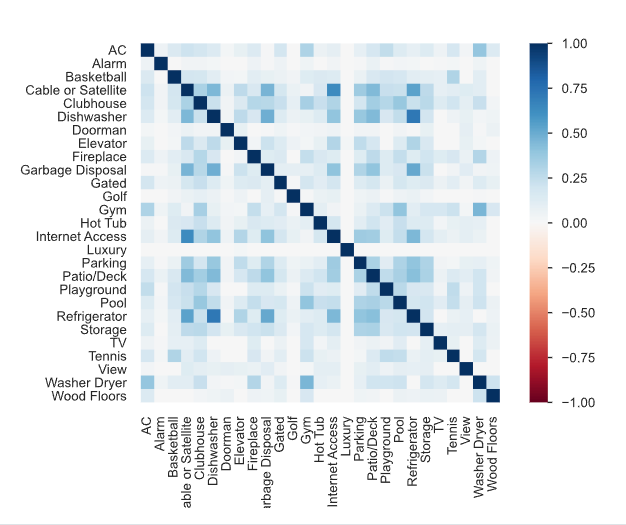

El unico valor que podria tener multicolinealidad de las neuvas variables es la de refrigerator con dishwasher pero para efectos del modelado, vamos a dejarlo como 2 variables distintas y observar si quizas encontramos valores relevantes.

# Bathrooms y Bedrooms


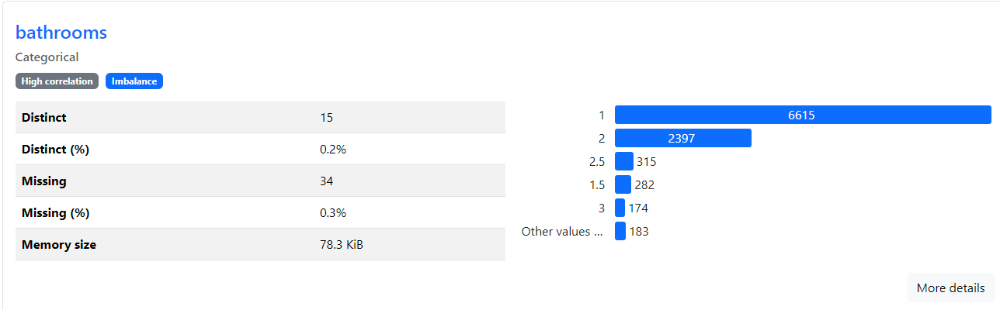

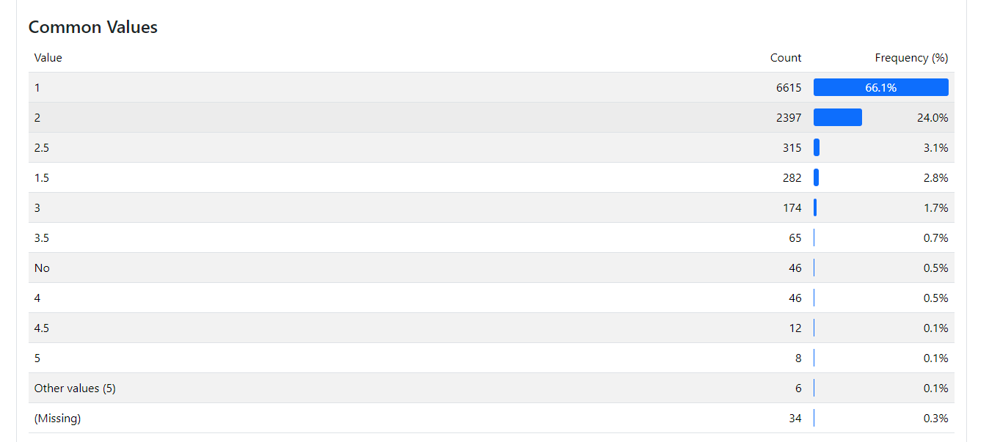

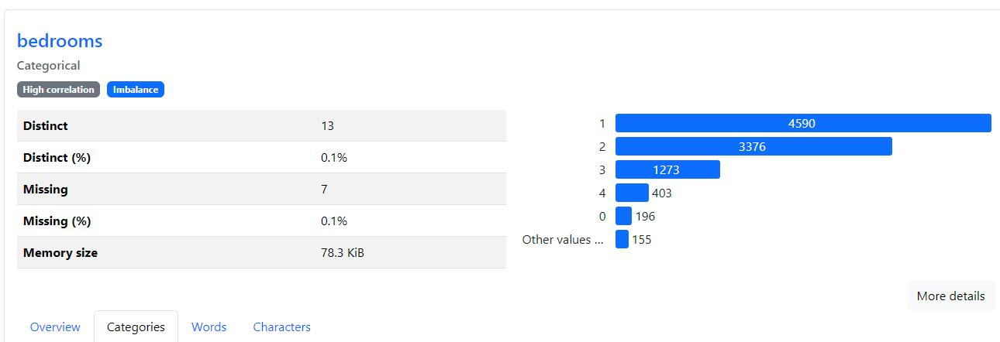

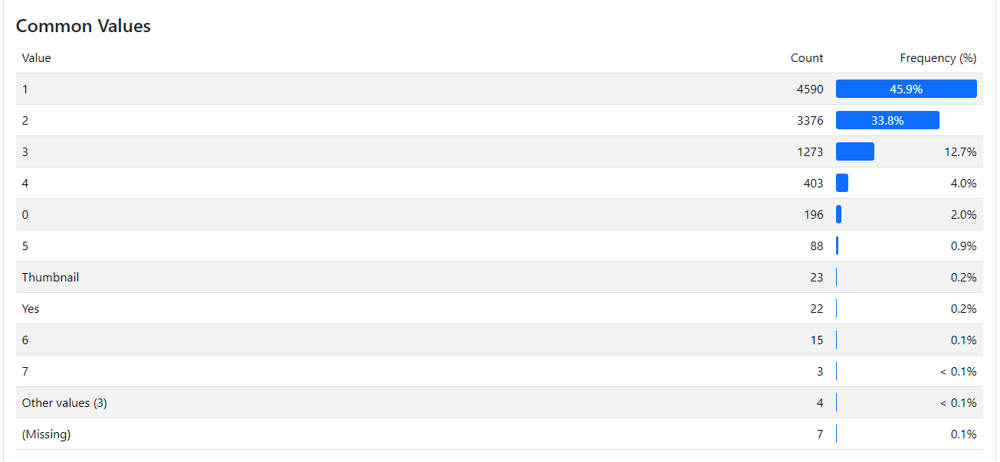

Para lso baños si encontramos valores bastante altos en correlacion a los bedrooms, por lo que, en este caso vamos a promediar la variable y dejar una unica variable de bathrooms_bedrooms_avg. Primero debemos eliminar los valores que son atipicos, por ejemplo los float de bathrooms y valores de tipo str. Como en el diccionario de datos no hablan de valores decimales, se aproximan al entero mas cercano hacia abajo.

In [17]:

def safe_convert(value):
    try:
        return int(value)
    except:
        return np.nan
    
df['bathrooms'] = df['bathrooms'].apply(safe_convert)

drop_indices = df[df['bathrooms'].isna()].index.tolist()

df.dropna(subset=['bathrooms'], inplace=True)

df.reset_index(inplace=True)

df.drop(columns=["index"],inplace=True)

df['bedrooms'] = df['bedrooms'].apply(safe_convert)

drop_indices = df[df['bedrooms'].isna()].index.tolist()

df.dropna(subset=['bedrooms'], inplace=True)

df.reset_index(inplace=True)

df.drop(columns=["index"],inplace=True)

df['bathrooms_bedrooms_avg'] = df[['bathrooms', 'bedrooms']].mean(axis=1)

df.drop(columns=['bathrooms', 'bedrooms'], inplace=True)



# Currency

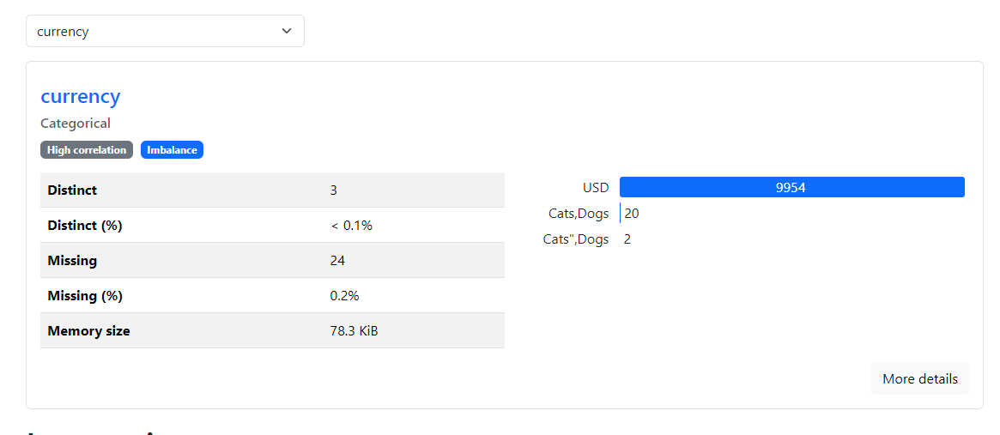

In [18]:
def currency_trans(item):
    try:
        if item != 'USD':
            item = np.nan
        return item
    except Exception as e:
        print(f"Error on currency_trans: {e}")
        
        
df['currency'] = df['currency'].apply(lambda x: currency_trans(x))

In [19]:
df.drop(columns="currency",inplace=True)

# Fee

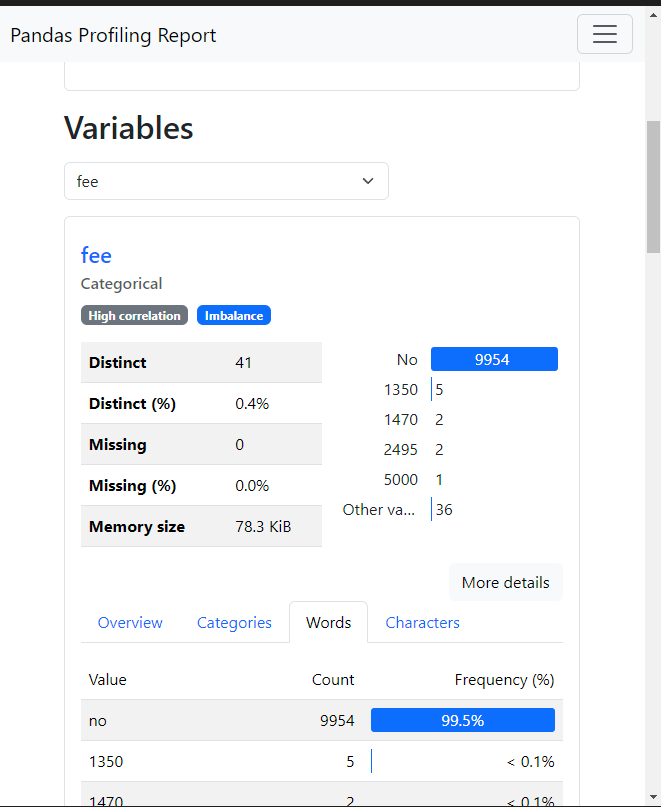

Como esta tan desbalaneceado se va a crear otra categoria como yes para los demas valores. Sin embargo, debido al alto desbalance se considera eliminar mejor.

In [20]:
def fee_transformation(item):
    try:
        if item.lower() != "no":
            item = "yes"
        else:
            item = "no"
        return item
    except Exception as e:
        print(f"Error on fee_transformation: {e}")
        
df['fee'] = df['fee'].apply(lambda x: fee_transformation(x))

In [21]:
df.drop(columns="fee",inplace=True)

# Has_photo

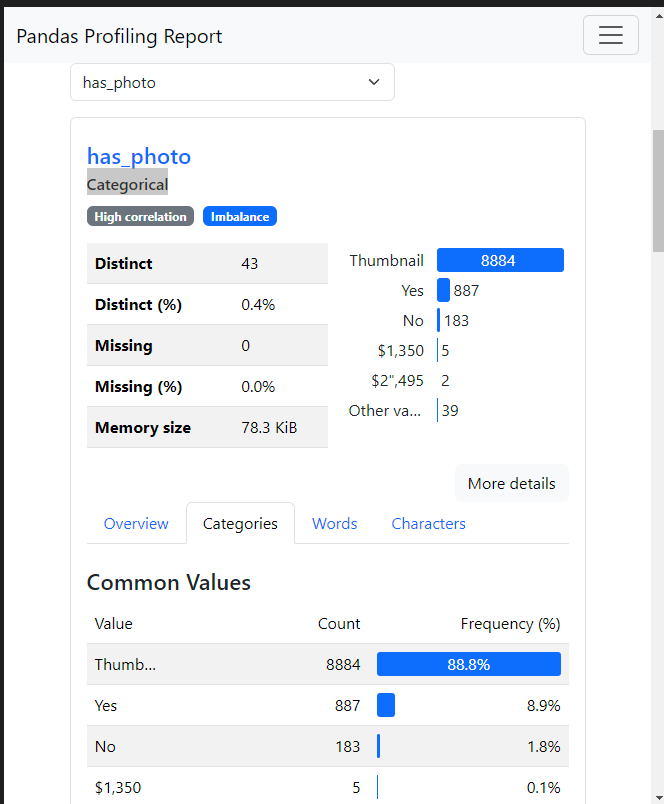

Ni siquiera tiene valores entonces vamos a hacerle drop

In [22]:
df.drop(columns=['has_photo'],inplace=True)

# Pets Allowed

Vamos a tomarla como una variable binaria para que queden los datos mucho mas balanceados

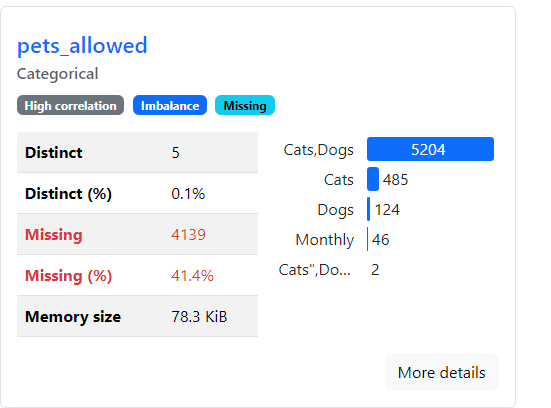

primero eliminamos valores atipicos

In [23]:
def one_hot_pets_allowed(item):
    """
    Convierte una cadena que representa las mascotas permitidas en un indicador binario.
    
    Parámetros:
        item (str): Cadena que puede contener "Cats", "Dogs", o "Cats,Dogs" (con o sin comillas y en cualquier mayúscula/minúscula).
    
    Retorna:
        int: 1 si se permite alguna de las combinaciones (gatos, perros o ambos), 0 en caso contrario.
    """
    try:
        # Verificamos que item sea una cadena; si no, retornamos 0
        if not isinstance(item, str):
            return 0
        
        # Eliminamos comillas y espacios, y convertimos a minúsculas
        cleaned = item.replace('"', '').lower().strip()
        
        # Definimos las opciones válidas
        allowed = {"cats", "dogs", "cats,dogs"}
        
        # Retornamos 1 si la cadena limpia se encuentra en las opciones permitidas, de lo contrario 0
        return 1 if cleaned in allowed else 0

    except Exception as e:
        print(f"Error in one_hot_pets_allowed: {e}")
        return 0


In [24]:
df["pets_allowed"] = df["pets_allowed"].apply(lambda x: one_hot_pets_allowed(x))

# Price


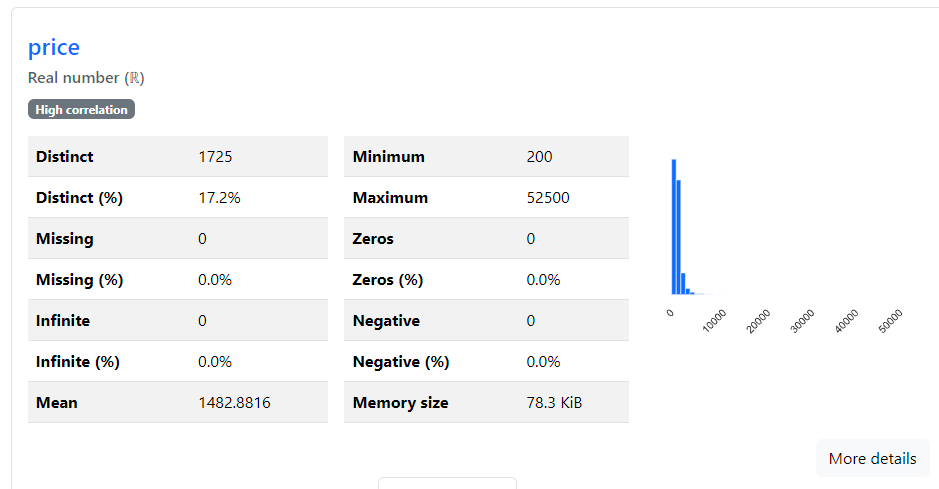

Como el histograma se ve tan alejado sospechamos de un dato anomalo, por lo tanto buscamos valores extremos del histograma

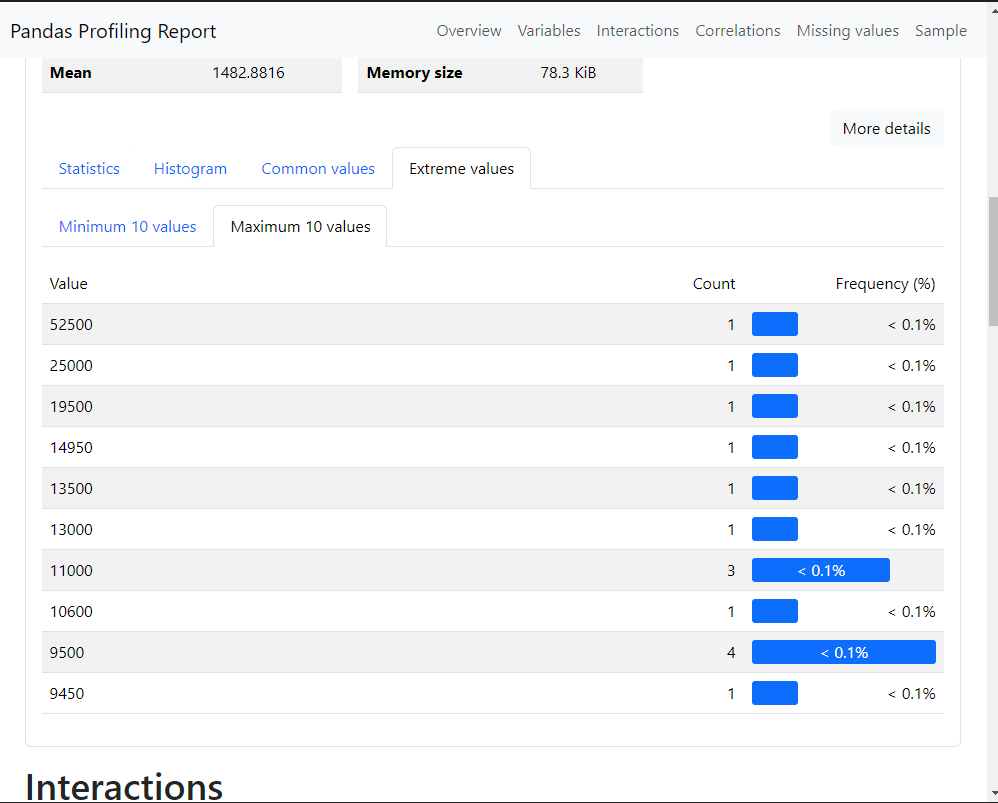

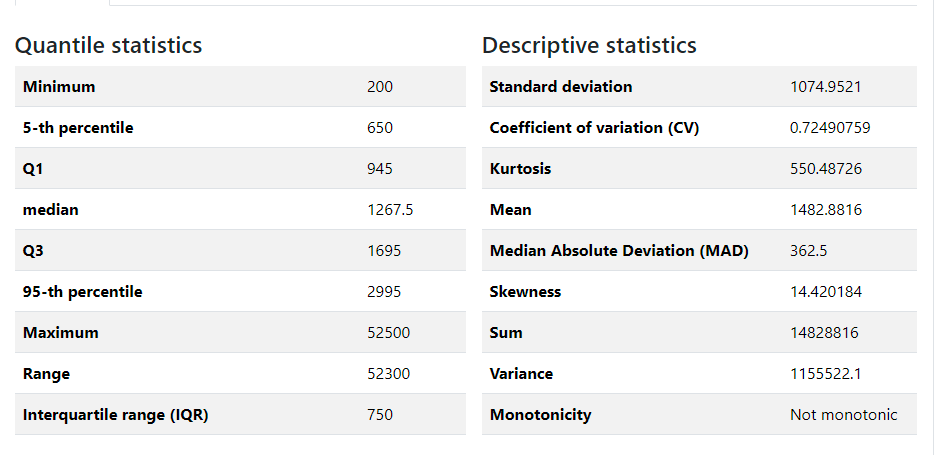

Vemos el valor de 52500 cuando la media del histograma es 1482.8816


Por lo tanto tomaremos los valores mayores al inmediatamente anterior maximo, y ese sera el limite que tomaremos para los precios del dataset de entrenamiento

In [25]:
lista_unica = list(set(df["price"]))
lista_unica.sort()
print(lista_unica[-2])

25000


In [26]:
lista_unica = list(set(df["price"]))
lista_unica.sort()
limite = lista_unica[-2]
df = df[df["price"] <= limite]

# Price display

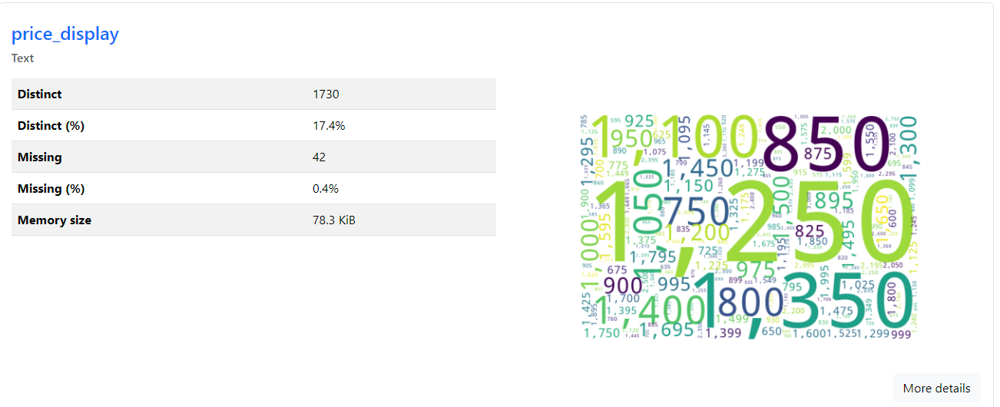

Debido al desbalance de datos que tiene se prefiere eliminar la columna, ademas no aporta mucha informacion para las preguntas de negocio

In [27]:
df.drop(columns=['price_display'],inplace=True)

# Price Type

No aporta mucha informacion los valores en su mayoria son Mensuales y solo algunos no lo son pero son typos.

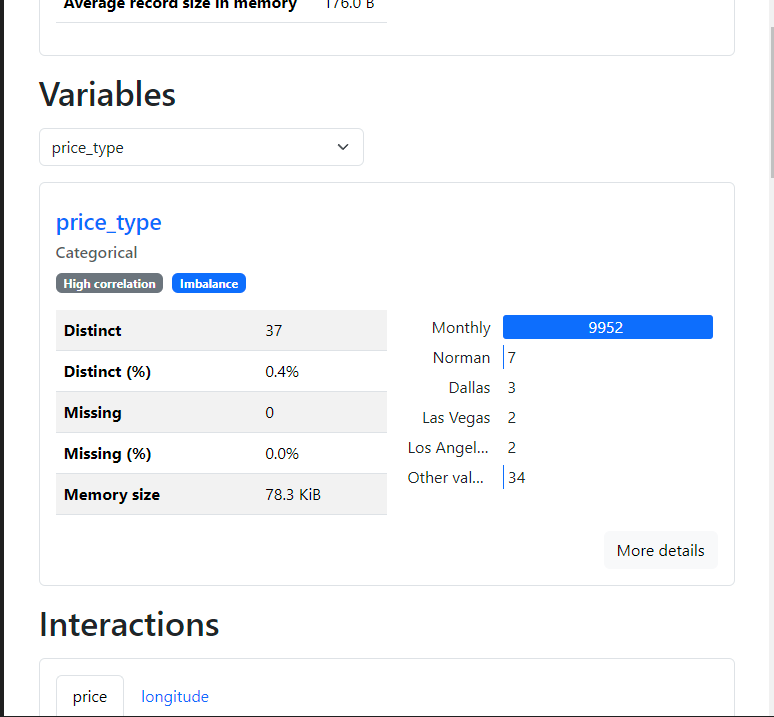

Vamos a elimianr esta variable por su poca relevancia

In [28]:
df.drop(columns=['price_type'],inplace=True)

# Square feet

Para los metros cuadrados, primero debemos hacer un cambio de str a int y revisar que datos tenemos

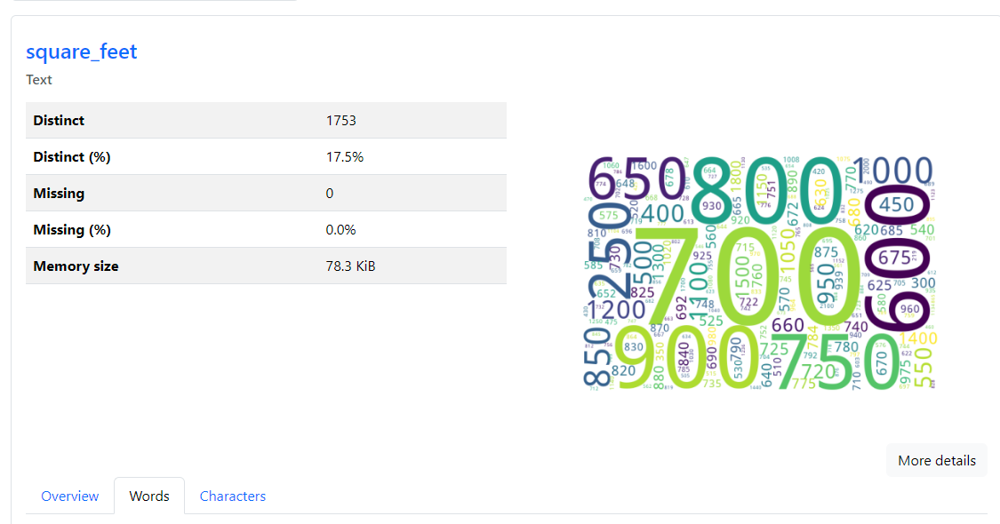

In [29]:
df['square_feet'] = df['square_feet'].apply(lambda x: safe_convert(x))

drop_indices = df[df['square_feet'].isna()].index.tolist()

df.dropna(subset=['square_feet'], inplace=True)

df.reset_index(inplace=True)

df.drop(columns=["index"],inplace=True)


# Address

Como son casi todos distintos se va a tomar como tiene o no tiene direccion para funcionar como variable binaria

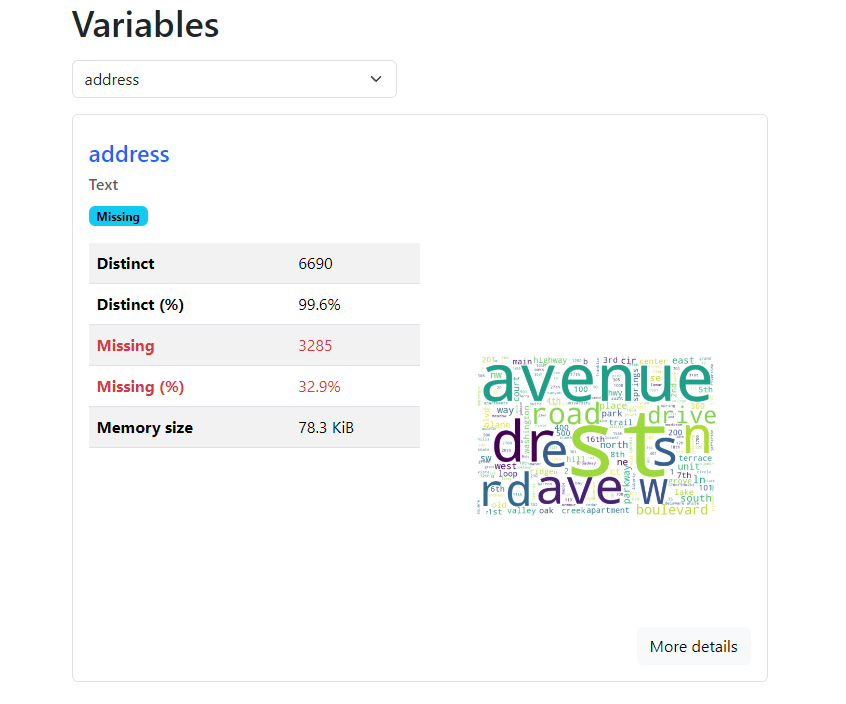

In [30]:
def binary_column(item):
    try:
        if pd.isna(item):
            item = 0
        else:
            item = 1
        return item
    except Exception as e:
        print(f"Error on binary_column as: {e}")
        
df['address'] = df['address'].apply(lambda x: binary_column(x))     

In [31]:
df.drop(columns=['address'],inplace=True)

# Cityname

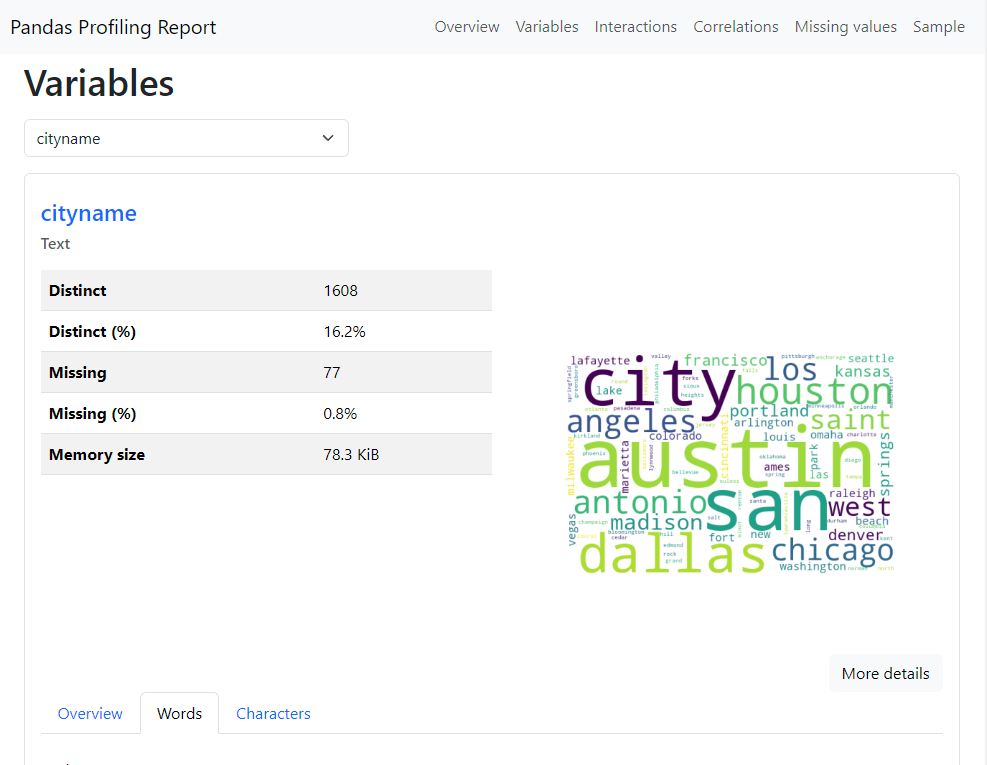

Ecnotnremos los valores que no son una ciudad

In [32]:
unicos = df['cityname'].unique().tolist()

valores_validos = []
valores_anomalos = []

def es_numero(valor):
    try:
        float(valor) 
        return True
    except:
        return False

for valor in unicos:
    if es_numero(valor) or pd.isna(valor):
        valores_anomalos.append(valor)
    else:
        valores_validos.append(valor)

print("Valores válidos:", valores_validos, len(valores_validos))
print("Valores anómalos:", valores_anomalos)

df['cityname'] = df['cityname'].replace(valores_anomalos, 'UNK')

Valores válidos: ['Arlington', 'Seattle', 'Manhattan', 'San Francisco', 'New Bern', 'Spring', 'Vallejo', 'Marietta', 'Charlotte', 'Tallahassee', 'Phoenix', 'Riverview', 'Lafayette', 'Glen Burnie', 'Littleton', 'Waldorf', 'Aurora', 'Manassas', 'Decatur', 'Tampa', 'Albuquerque', 'Chicago', 'Gastonia', 'Wimauma', 'Memphis', 'Bellingham', 'Anchorage', 'Pacifica', 'Marina Del Rey', 'Studio City', 'Moorpark', 'Torrance', 'Sacramento', 'Lake Balboa', 'North Hollywood', 'Denver', 'Brentwood', 'San Rafael', 'North Potomac', 'Andover', 'Oakland', 'San Pablo', 'Alexandria', 'Thousand Oaks', 'Burke', 'Bellevue', 'Wilton', 'Woodland Hills', 'Miami', 'Hyattsville', 'Westminster', 'Arvada', 'Seal Beach', 'San Marcos', 'Medford Lakes', 'Concord', 'Chula Vista', 'Highlands Ranch', 'Laurel', 'Orlando', 'Boulder', 'La Puente', 'Anaheim', 'Commerce City', 'Naples', 'Atlanta', 'Sarasota', 'Lorton', 'Fort Lupton', 'Woodbridge', 'Nashville', 'Saint Petersburg', 'Portland', 'Joppa', 'Broomfield', 'Englewood',

# State

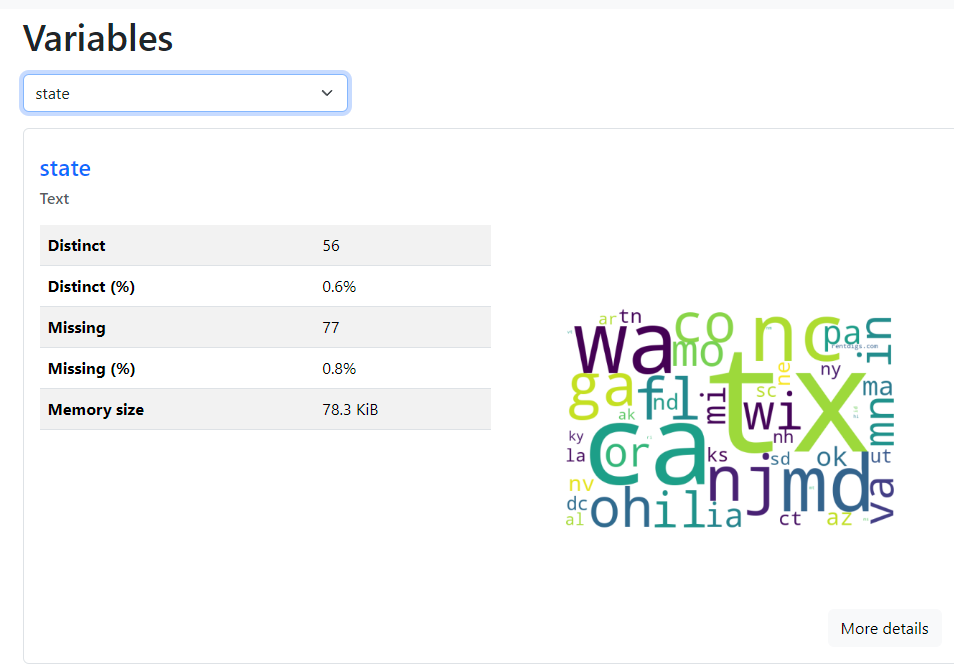

In [33]:
def identify_state(item):
    try:
        item = str(item) if not pd.isna(item) else "UNK"
        if len(item) > 2 or pd.isna(item):
            item = "UNK"
        return item
    except Exception as e:
        print(f"Error on identify_state: {e}")

In [34]:
df['state'] = df['state'].apply(lambda x: identify_state(x))

In [35]:
df['state'].unique().tolist()

['VA',
 'WA',
 'NY',
 'CA',
 'NC',
 'TX',
 'GA',
 'FL',
 'UNK',
 'AZ',
 'AL',
 'MD',
 'CO',
 'NM',
 'IL',
 'TN',
 'AK',
 'MA',
 'NJ',
 'OR',
 'DE',
 'PA',
 'IA',
 'SC',
 'MN',
 'MI',
 'KY',
 'WI',
 'DC',
 'IN',
 'OH',
 'RI',
 'NV',
 'UT',
 'CT',
 'MO',
 'OK',
 'NH',
 'NE',
 'LA',
 'ND',
 'AR',
 'KS',
 'ID',
 'HI',
 'MT',
 'VT',
 'SD',
 'WV',
 'MS',
 'ME',
 'WY']

# Latitude

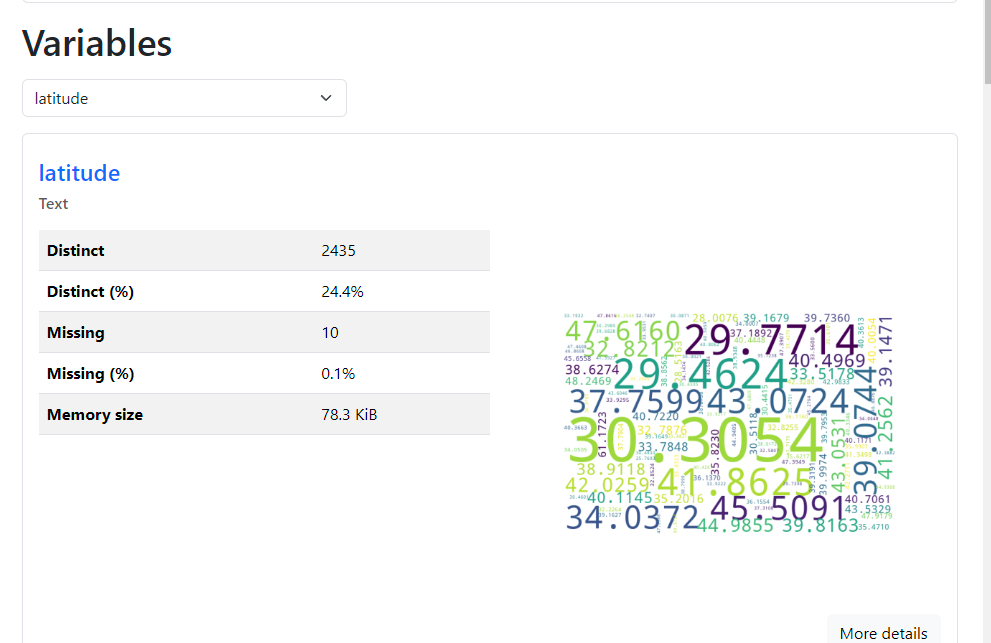

In [36]:
def clean_latitude(value):
    try:
        if isinstance(value, str):
            value = value.strip().replace('"', '')
            value = value.replace(",", "")
            return round(float(value), 4)
        elif not pd.isna(value) and isinstance(value, (int, float)):
            return round(value, 4)
        else:
            return "UNK"
    except Exception as e:
        print(f"Error on clean_latitude: {e}")
        return "UNK"

df['latitude'] = df['latitude'].apply(clean_latitude)


# Longitude

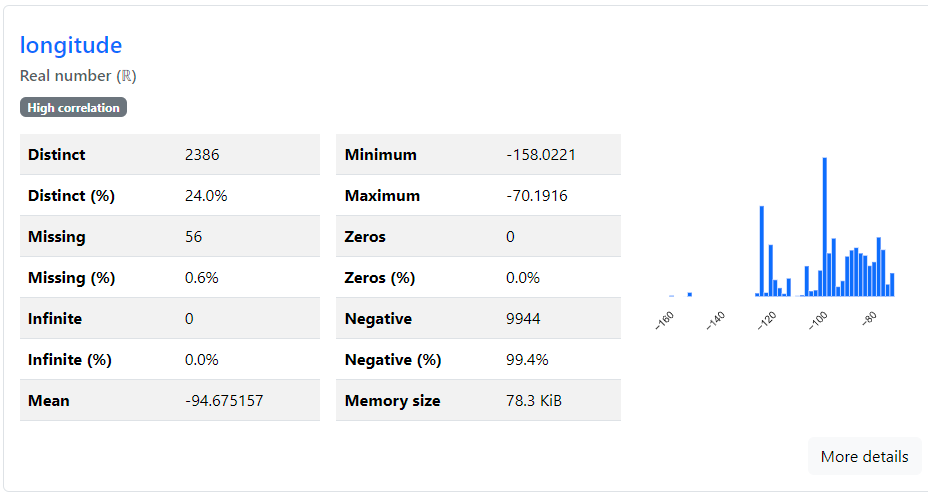

In [37]:
def clean_longitude(item):
    try:
        if pd.isna(item):
            item = "UNK"
        return item
    except Exception as e:
        print(f"Error on clean_longitude: {e}")
        
df['longitude'] = df['longitude'].apply(lambda x: clean_longitude(x))

# Source

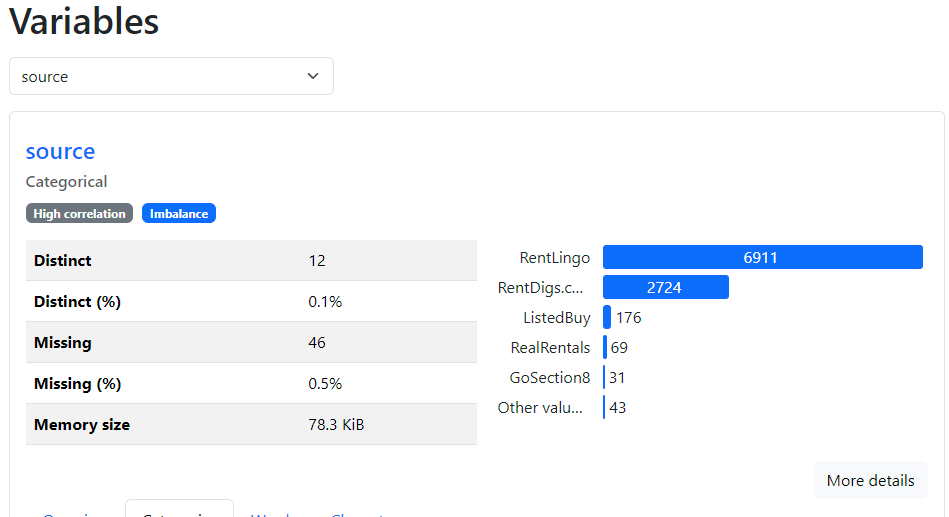

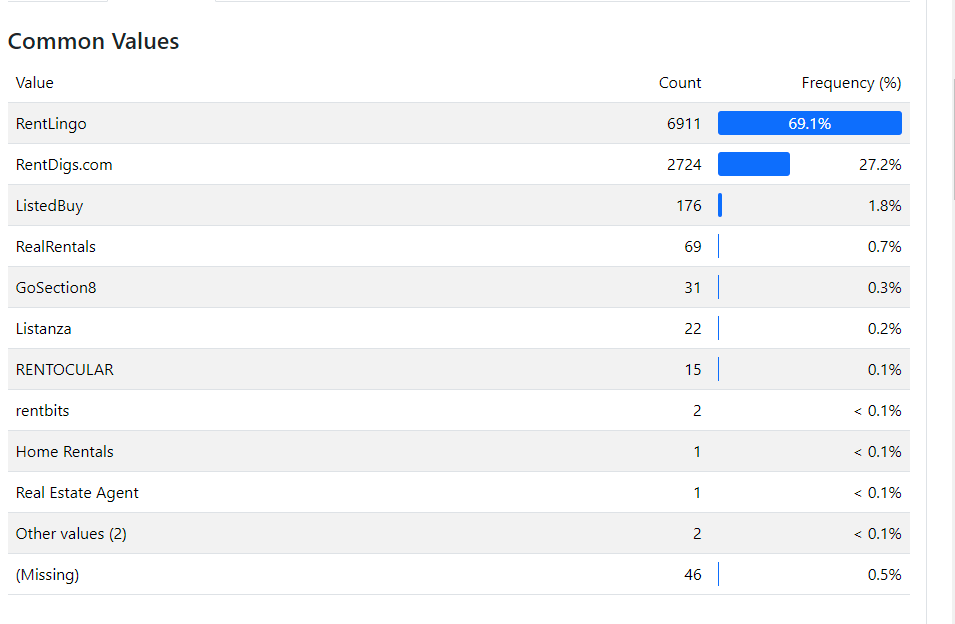

In [38]:
def clean_source(item):
    try:
        if item != "RentLingo" and item != "RentDigs.com":
            item = "Other"
        return item
    except Exception as e:
        print(f"Error on clean_source : {e}")

df["source"] = df["source"].apply(lambda x: clean_source(x))

# Time

Como tiene un valor tan alto de distintos no lo tomaremos en cuenta para el modelado ya que el modelo se puede sesgar

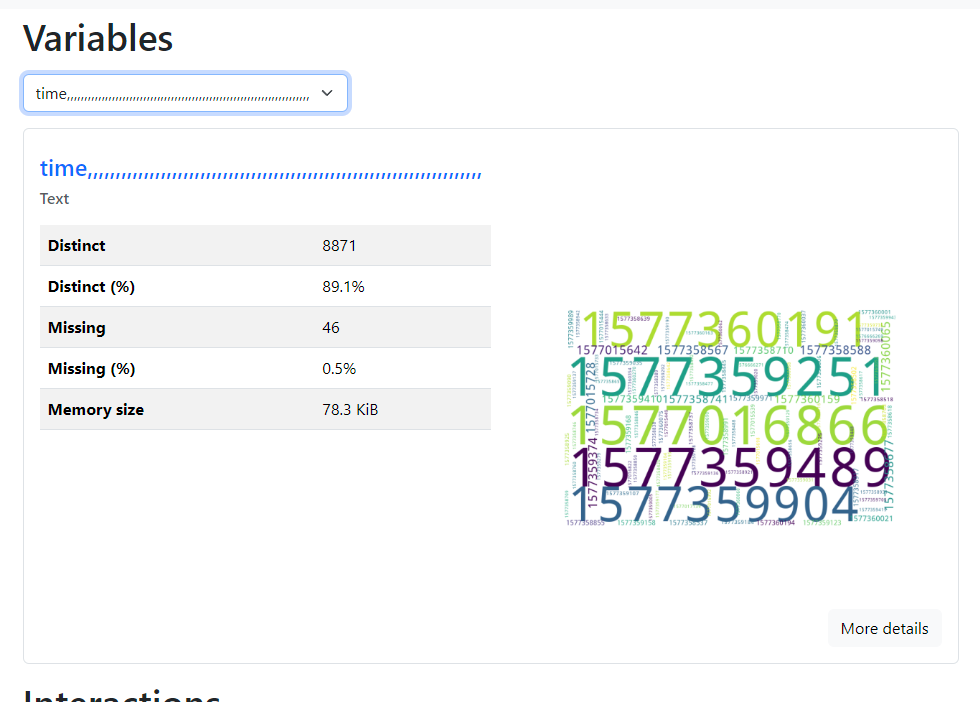

In [39]:
df.drop(columns=["time,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"],inplace=True)

In [40]:
ydata_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [41]:
for columna in df.columns:
    print(f"Distribución porcentual en '{columna}':")
    porcentajes = df[columna].value_counts(normalize=True) * 100
    print(porcentajes.round(2))  # redondea a 2 decimales
    print("-" * 50)
    


Distribución porcentual en 'pets_allowed':
pets_allowed
1    58.67
0    41.33
Name: proportion, dtype: float64
--------------------------------------------------
Distribución porcentual en 'price':
price
850      0.86
1250     0.80
1100     0.78
1350     0.78
1050     0.76
         ... 
288      0.01
636      0.01
3294     0.01
1632     0.01
25000    0.01
Name: proportion, Length: 1667, dtype: float64
--------------------------------------------------
Distribución porcentual en 'square_feet':
square_feet
700     2.00
800     1.66
600     1.63
900     1.50
750     1.50
        ... 
1491    0.01
1501    0.01
1502    0.01
1506    0.01
8716    0.01
Name: proportion, Length: 1587, dtype: float64
--------------------------------------------------
Distribución porcentual en 'cityname':
cityname
Austin         5.60
Dallas         2.21
Houston        1.96
San Antonio    1.94
Los Angeles    1.60
               ... 
Moses Lake     0.01
Irving         0.01
Westland       0.01
Fox Point      0.01
C